In [1]:
import pandas as pd
import numpy as np
import scipy

import matplotlib.pyplot as plt
import seaborn as sns

from google.cloud import bigquery as bq

%matplotlib inline

# All subtype-specific sig-DMDs
## Meth matrix

In [2]:
subtype_meth_bigtable = pd.read_table("./datasets/subtype_meth_bigtable.HM450.tsv", sep="\t")

print(subtype_meth_bigtable.shape)
subtype_meth_bigtable.head()

/home/singuyen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(20220571, 15)


,case_barcode,sample_barcode,aliquot_barcode,probe_id,avg_beta_value,sample_type,sample_type_name,subtype,ER,PR,Her2_IHC,Her2_ISH,Her2,triple_negative,subtype_sub
0,TCGA-D8-A1JT,TCGA-D8-A1JT-01A,TCGA-D8-A1JT-01A-31D-A13K-05,cg21679391,0.97,1,Primary solid Tumor,LumB,Positive,Positive,2+,Negative,NaN,Unknown,LumB
1,TCGA-D8-A1JT,TCGA-D8-A1JT-01A,TCGA-D8-A1JT-01A-31D-A13K-05,cg01846046,0.94,1,Primary solid Tumor,LumB,Positive,Positive,2+,Negative,NaN,Unknown,LumB
2,TCGA-D8-A1JT,TCGA-D8-A1JT-01A,TCGA-D8-A1JT-01A-31D-A13K-05,cg12967902,0.94,1,Primary solid Tumor,LumB,Positive,Positive,2+,Negative,NaN,Unknown,LumB
3,TCGA-D8-A1JT,TCGA-D8-A1JT-01A,TCGA-D8-A1JT-01A-31D-A13K-05,cg21919790,0.99,1,Primary solid Tumor,LumB,Positive,Positive,2+,Negative,NaN,Unknown,LumB
4,TCGA-D8-A1JT,TCGA-D8-A1JT-01A,TCGA-D8-A1JT-01A-31D-A13K-05,cg01263854,0.98,1,Primary solid Tumor,LumB,Positive,Positive,2+,Negative,NaN,Unknown,LumB


In [3]:
df = subtype_meth_bigtable.drop_duplicates(subset="sample_barcode")

print("Sample types")
print(df.sample_type_name.value_counts())
print("\n")

print("BRCA subtypes")
print(df.loc[df['sample_type']==1].subtype_sub.value_counts())

Sample types
Primary solid Tumor    789
Solid Tissue Normal     98
Metastatic               5
Name: sample_type_name, dtype: int64


BRCA subtypes
LumA        419
LumB        147
Basal        78
Basal-TN     57
Her2         46
Normal       34
Unknown       8
Name: subtype_sub, dtype: int64


In [4]:
meth_matrix = subtype_meth_bigtable.pivot(index='probe_id', columns='aliquot_barcode', values='avg_beta_value')

print(meth_matrix.shape)
meth_matrix.head()

(22638, 894)


aliquot_barcode,TCGA-3C-AAAU-01A-11D-A41Q-05,TCGA-3C-AALI-01A-11D-A41Q-05,TCGA-3C-AALJ-01A-31D-A41Q-05,TCGA-3C-AALK-01A-11D-A41Q-05,TCGA-4H-AAAK-01A-12D-A41Q-05,TCGA-5L-AAT0-01A-12D-A41Q-05,TCGA-5L-AAT1-01A-12D-A41Q-05,TCGA-5T-A9QA-01A-11D-A41Q-05,TCGA-A1-A0SB-01A-11D-A145-05,TCGA-A1-A0SE-01A-11D-A10P-05,...,TCGA-UL-AAZ6-01A-11D-A41Q-05,TCGA-UU-A93S-01A-21D-A41Q-05,TCGA-V7-A7HQ-01A-11D-A33F-05,TCGA-W8-A86G-01A-21D-A36K-05,TCGA-WT-AB41-01A-11D-A41Q-05,TCGA-WT-AB44-01A-11D-A41Q-05,TCGA-XX-A899-01A-11D-A36K-05,TCGA-XX-A89A-01A-11D-A36K-05,TCGA-Z7-A8R5-01A-42D-A41Q-05,TCGA-Z7-A8R6-01A-11D-A41Q-05
probe_id,,,,,,,,,,,,,,,,,,,,,
cg00000029,0.10,0.14,0.15,0.20,0.21,0.24,0.25,0.10,0.06,0.16,...,0.23,0.13,0.12,0.18,0.25,0.18,0.28,0.25,0.23,0.08
cg00000321,0.39,0.30,0.61,0.58,0.47,0.59,0.40,0.78,0.26,0.30,...,0.61,0.62,0.50,0.47,0.65,0.66,0.54,0.28,0.50,0.13
cg00000363,0.22,0.43,0.77,0.68,0.21,0.25,0.47,0.84,0.06,0.41,...,0.68,0.45,0.13,0.31,0.19,0.31,0.25,0.21,0.39,0.11
cg00001747,0.03,0.06,0.06,0.55,0.62,0.38,0.53,0.84,0.01,0.06,...,0.79,0.39,0.17,0.04,0.55,0.70,0.52,0.37,0.08,0.34
cg00002426,0.31,0.87,0.45,0.39,0.35,0.46,0.56,0.85,0.12,0.36,...,0.41,0.43,0.31,0.34,0.53,0.27,0.54,0.48,0.51,0.22


## Correlation among all samples, all sig-DMDs

In [ ]:
corr = meth_matrix.corr()

In [ ]:
corr.to_csv("./datasets/subtype_meth_corr.allsigDMD.HM450.tsv", sep="\t")
del corr

--------------------------------------

In [5]:
corr = pd.read_table("./datasets/subtype_meth_corr.allsigDMD.HM450.tsv", sep="\t", index_col='aliquot_barcode')
corr

,TCGA-3C-AAAU-01A-11D-A41Q-05,TCGA-3C-AALI-01A-11D-A41Q-05,TCGA-3C-AALJ-01A-31D-A41Q-05,TCGA-3C-AALK-01A-11D-A41Q-05,TCGA-4H-AAAK-01A-12D-A41Q-05,TCGA-5L-AAT0-01A-12D-A41Q-05,TCGA-5L-AAT1-01A-12D-A41Q-05,TCGA-5T-A9QA-01A-11D-A41Q-05,TCGA-A1-A0SB-01A-11D-A145-05,TCGA-A1-A0SE-01A-11D-A10P-05,...,TCGA-UL-AAZ6-01A-11D-A41Q-05,TCGA-UU-A93S-01A-21D-A41Q-05,TCGA-V7-A7HQ-01A-11D-A33F-05,TCGA-W8-A86G-01A-21D-A36K-05,TCGA-WT-AB41-01A-11D-A41Q-05,TCGA-WT-AB44-01A-11D-A41Q-05,TCGA-XX-A899-01A-11D-A36K-05,TCGA-XX-A89A-01A-11D-A36K-05,TCGA-Z7-A8R5-01A-42D-A41Q-05,TCGA-Z7-A8R6-01A-11D-A41Q-05
aliquot_barcode,,,,,,,,,,,,,,,,,,,,,
TCGA-3C-AAAU-01A-11D-A41Q-05,1.000000,0.713910,0.734213,0.732222,0.754234,0.758741,0.734037,0.602536,0.565416,0.781523,...,0.685622,0.629560,0.770504,0.757485,0.695147,0.700924,0.719371,0.729499,0.736685,0.732241
TCGA-3C-AALI-01A-11D-A41Q-05,0.713910,1.000000,0.776073,0.748062,0.716982,0.730285,0.752015,0.624025,0.543782,0.749975,...,0.728024,0.690138,0.724836,0.717610,0.699101,0.667122,0.719496,0.746099,0.728448,0.682262
TCGA-3C-AALJ-01A-31D-A41Q-05,0.734213,0.776073,1.000000,0.826138,0.750854,0.761400,0.797207,0.746347,0.521093,0.758394,...,0.780077,0.700726,0.740297,0.728592,0.757802,0.723125,0.762600,0.729313,0.750337,0.693430
TCGA-3C-AALK-01A-11D-A41Q-05,0.732222,0.748062,0.826138,1.000000,0.848914,0.860139,0.888383,0.800670,0.621249,0.841758,...,0.717335,0.717455,0.814771,0.848342,0.851420,0.832207,0.873215,0.787240,0.869361,0.760551
TCGA-4H-AAAK-01A-12D-A41Q-05,0.754234,0.716982,0.750854,0.848914,1.000000,0.868780,0.856004,0.704421,0.673680,0.857708,...,0.650815,0.666839,0.856138,0.880660,0.813093,0.821075,0.868429,0.814416,0.870395,0.801015
TCGA-5L-AAT0-01A-12D-A41Q-05,0.758741,0.730285,0.761400,0.860139,0.868780,1.000000,0.880464,0.688665,0.689266,0.876006,...,0.635784,0.673816,0.859271,0.891111,0.839607,0.816339,0.889143,0.840395,0.896964,0.795798
TCGA-5L-AAT1-01A-12D-A41Q-05,0.734037,0.752015,0.797207,0.888383,0.856004,0.880464,1.000000,0.746460,0.636640,0.842632,...,0.664734,0.719407,0.820639,0.850490,0.871928,0.820007,0.912710,0.837639,0.895448,0.759338
TCGA-5T-A9QA-01A-11D-A41Q-05,0.602536,0.624025,0.746347,0.800670,0.704421,0.688665,0.746460,1.000000,0.477880,0.672652,...,0.673227,0.614551,0.653410,0.681863,0.762236,0.732300,0.730979,0.630318,0.701672,0.610005
TCGA-A1-A0SB-01A-11D-A145-05,0.565416,0.543782,0.521093,0.621249,0.673680,0.689266,0.636640,0.477880,1.000000,0.700456,...,0.406684,0.469546,0.674200,0.755054,0.621194,0.606283,0.680774,0.672949,0.758611,0.586076


In [6]:
print(corr.min().min())
print(corr.max().max())

0.1852217820323883
1.0


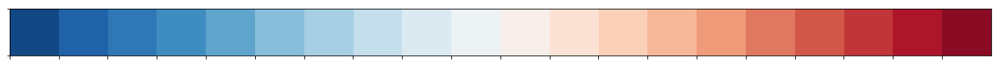

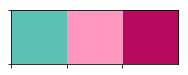

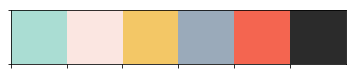

In [7]:
sns.palplot(sns.color_palette("RdBu_r", n_colors=20))

sns.palplot(sns.color_palette(["#5bc1b5", "#ff96c0", "#b7095d"])) 
sns.palplot(sns.color_palette(["#aaddd3", "#fbe6e1", "#f3c766", "#9aaaba", "#f46550", 
                               "#2b2b2b"]))

In [8]:
color_matrix = pd.DataFrame()
df = subtype_meth_bigtable.drop_duplicates(subset="aliquot_barcode")

print(df['sample_type_name'].unique())
print(df['subtype'].unique())
print(df['triple_negative'].unique())

['Primary solid Tumor' 'Solid Tissue Normal' 'Metastatic']
['LumB' 'LumA' 'Basal' 'Normal' 'Her2' 'Unknown']
['Unknown' 'Yes']


In [9]:
c = dict(zip(df['sample_type_name'].unique(), ["#ff96c0", "#5bc1b5", "#b7095d"]))
color_matrix['Sample type'] = df['sample_type_name'].map(c)

c = dict(zip(df['subtype'].unique(), ["#f3c766", "#fbe6e1", "#f46550", "#aaddd3", "#9aaaba", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Sample type,Subtype,Triple negative
aliquot_barcode,,,
TCGA-D8-A1JT-01A-31D-A13K-05,#ff96c0,#f3c766,#ffffff
TCGA-LL-A6FP-01A-11D-A31V-05,#ff96c0,#fbe6e1,#ffffff
TCGA-E9-A249-01A-11D-A16A-05,#ff96c0,#f3c766,#ffffff
TCGA-E9-A1ND-01A-11D-A145-05,#ff96c0,#f46550,#ffffff
TCGA-BH-A1FJ-01A-11D-A13K-05,#ff96c0,#f3c766,#ffffff


### data matrix - methylation data

In [10]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
meth_matrix = subtype_meth_bigtable.pivot(index='probe_id', columns='aliquot_barcode', values='avg_beta_value')

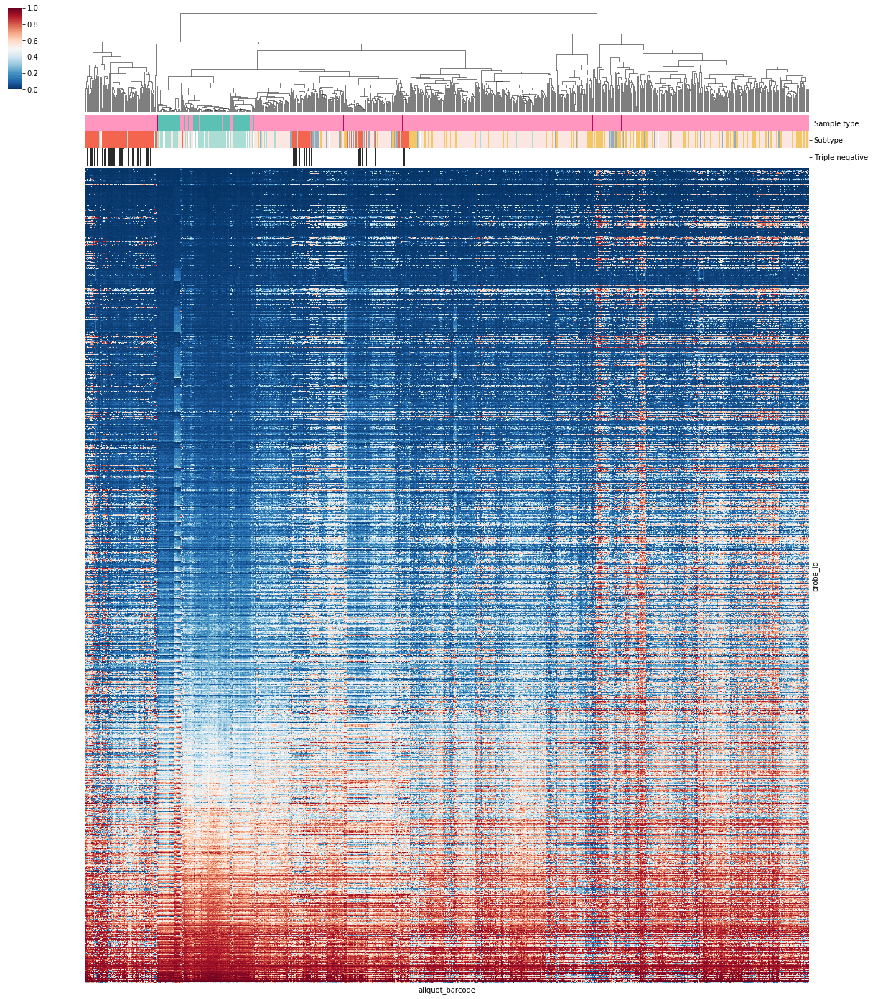

In [11]:
normal_aliquots = subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type']==11, 'aliquot_barcode'].unique()

g = sns.clustermap(data=meth_matrix.sort_values(by=list(normal_aliquots)), 
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="RdBu_r", vmin=0, vmax=1, figsize=(20,25), 
                   xticklabels=False, yticklabels=False)

In [12]:
g.savefig("./plots/cluster_meth.subtype.methdata.png", transparent=True, bbox_inches='tight')

### data matrix - correlation matrix

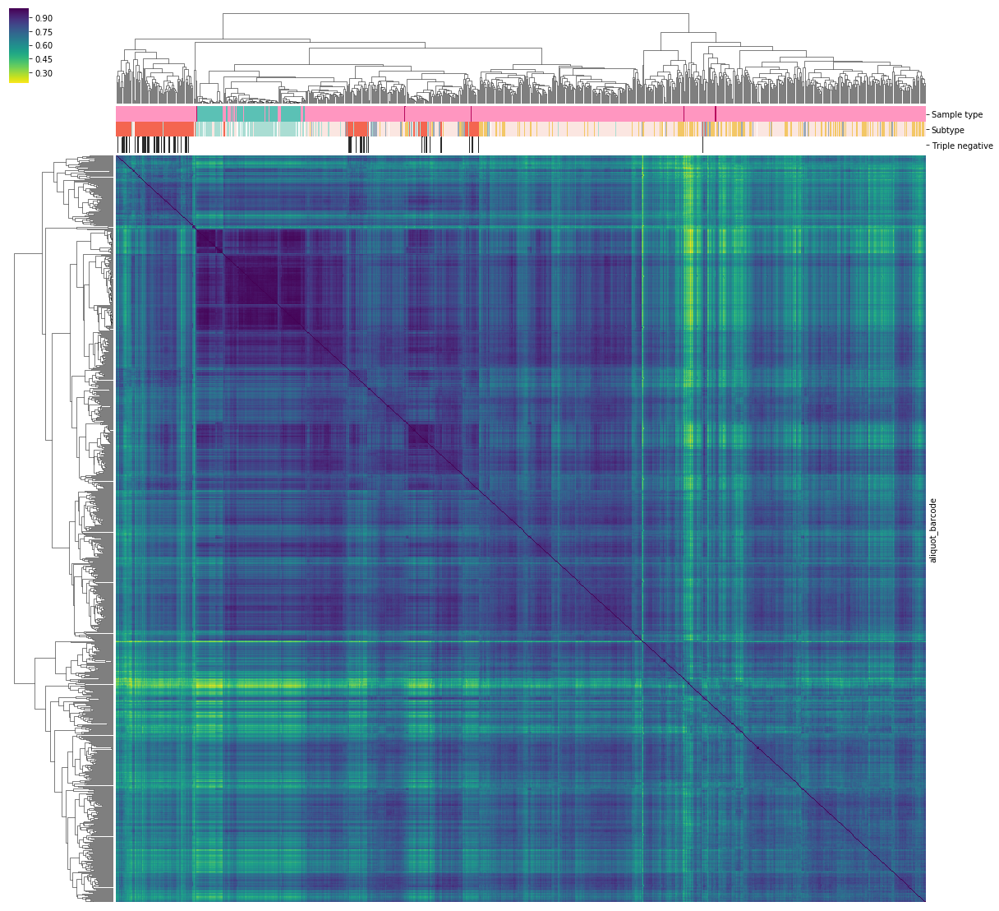

In [13]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g1 = sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
                    col_colors=color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,20), 
                    xticklabels=False, yticklabels=False)

In [14]:
g1.savefig("./plots/cluster_meth.subtype.corrdata.png", transparent=True, bbox_inches='tight')

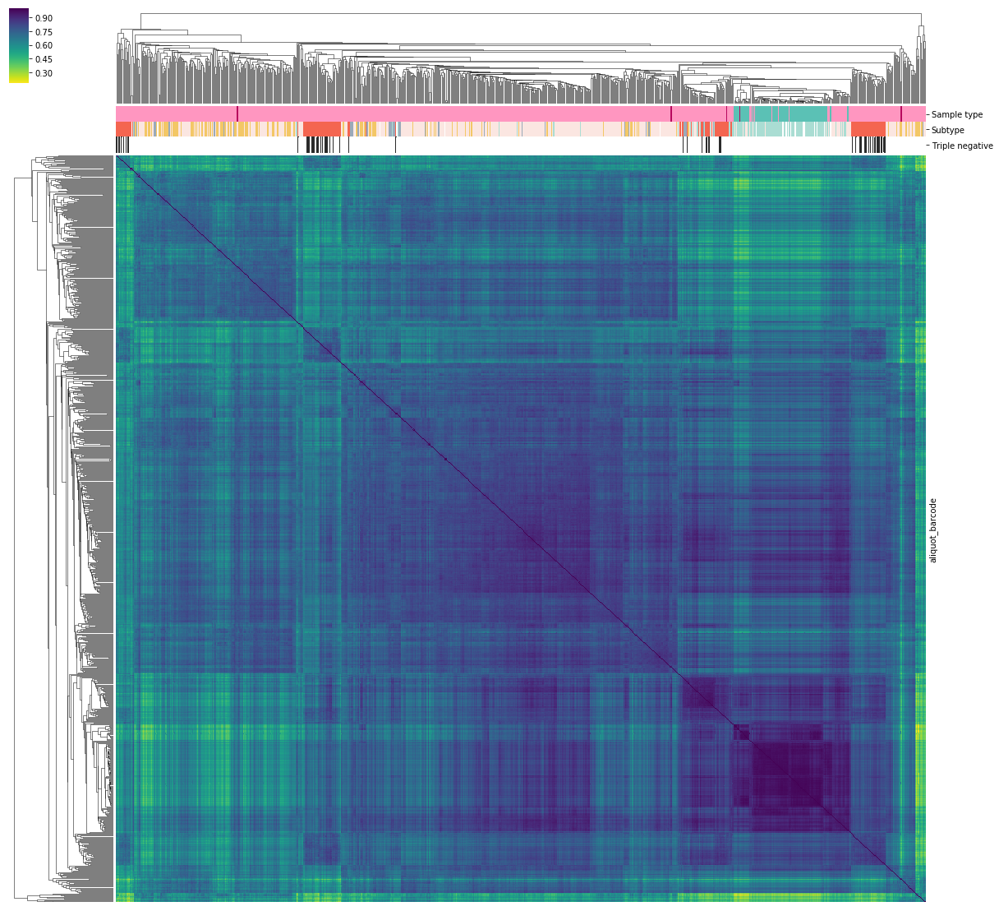

In [15]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
               col_colors=color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)

# Exclude normal

In [16]:
exclude_normal = subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] != 11]
corr_excl_normal = corr.loc[list(exclude_normal['aliquot_barcode'].unique()), 
                            list(exclude_normal['aliquot_barcode'].unique())]

print(exclude_normal.shape)
print(exclude_normal.head())

print(corr_excl_normal.shape)

(18003790, 15)
   case_barcode    sample_barcode               aliquot_barcode    probe_id  \
0  TCGA-D8-A1JT  TCGA-D8-A1JT-01A  TCGA-D8-A1JT-01A-31D-A13K-05  cg21679391   
1  TCGA-D8-A1JT  TCGA-D8-A1JT-01A  TCGA-D8-A1JT-01A-31D-A13K-05  cg01846046   
2  TCGA-D8-A1JT  TCGA-D8-A1JT-01A  TCGA-D8-A1JT-01A-31D-A13K-05  cg12967902   
3  TCGA-D8-A1JT  TCGA-D8-A1JT-01A  TCGA-D8-A1JT-01A-31D-A13K-05  cg21919790   
4  TCGA-D8-A1JT  TCGA-D8-A1JT-01A  TCGA-D8-A1JT-01A-31D-A13K-05  cg01263854   

   avg_beta_value  sample_type     sample_type_name subtype        ER  \
0            0.97            1  Primary solid Tumor    LumB  Positive   
1            0.94            1  Primary solid Tumor    LumB  Positive   
2            0.94            1  Primary solid Tumor    LumB  Positive   
3            0.99            1  Primary solid Tumor    LumB  Positive   
4            0.98            1  Primary solid Tumor    LumB  Positive   

         PR Her2_IHC  Her2_ISH Her2 triple_negative subtype_sub  
0  Po

In [17]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['subtype'].unique()

array(['LumB', 'LumA', 'Basal', 'Normal', 'Her2', 'Unknown'], dtype=object)

In [18]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['triple_negative'].unique()

array(['Unknown', 'Yes'], dtype=object)

In [19]:
color_matrix = pd.DataFrame()
df = exclude_normal.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#f3c766", "#fbe6e1", "#f46550", "#aaddd3", "#9aaaba", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype,Triple negative
aliquot_barcode,,
TCGA-D8-A1JT-01A-31D-A13K-05,#f3c766,#ffffff
TCGA-LL-A6FP-01A-11D-A31V-05,#fbe6e1,#ffffff
TCGA-E9-A249-01A-11D-A16A-05,#f3c766,#ffffff
TCGA-E9-A1ND-01A-11D-A145-05,#f46550,#ffffff
TCGA-BH-A1FJ-01A-11D-A13K-05,#f3c766,#ffffff


### data matrix - methylation data

In [20]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')
meth_matrix = subtype_meth_bigtable.pivot(
                                    index='probe_id', columns='aliquot_barcode', values='avg_beta_value'
                                    ).loc[:,list(exclude_normal['aliquot_barcode'].unique())]

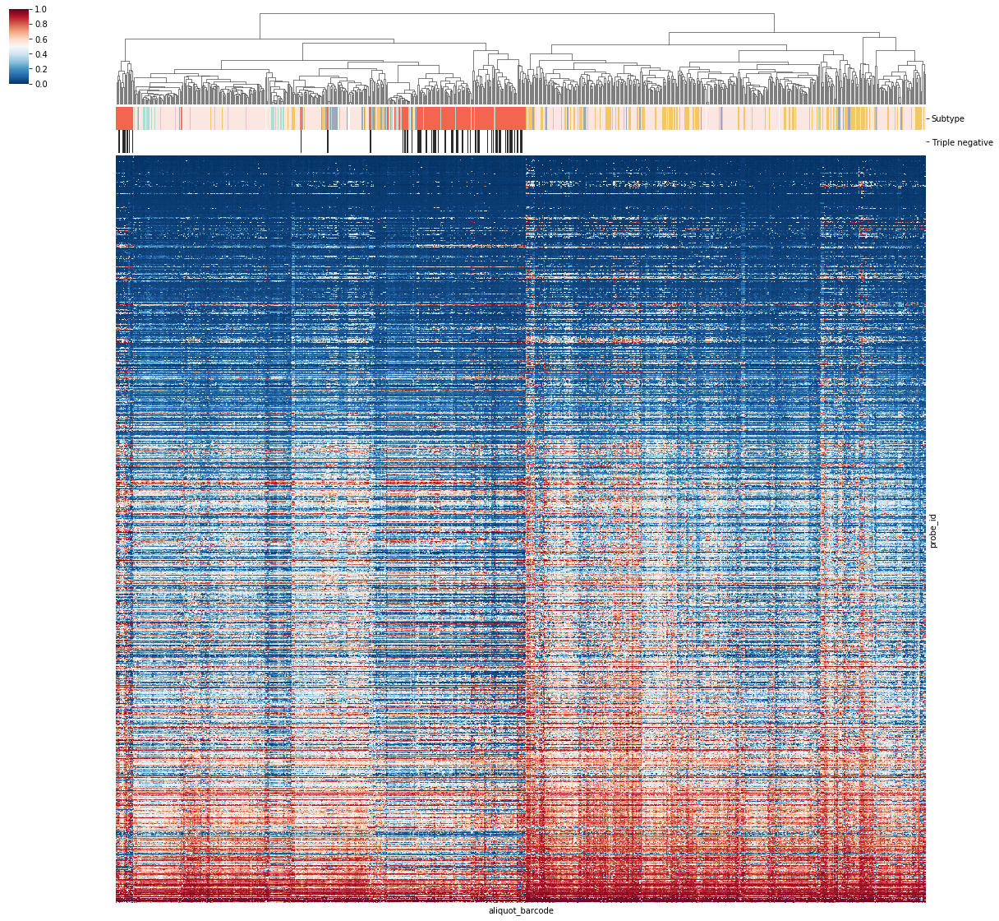

In [21]:
luminal_aliquots = exclude_normal.loc[(exclude_normal['subtype']=='LumA') | (exclude_normal['subtype']=='LumB'), 
                                      'aliquot_barcode'].unique()

g2 = sns.clustermap(data=meth_matrix.sort_values(by=list(luminal_aliquots)),
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="RdBu_r", vmin=0, vmax=1, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [22]:
g2.savefig("./plots/cluster_meth.subtype.exclNormal.methdata.png", transparent=True, bbox_inches='tight')

### data matrix - correlation data

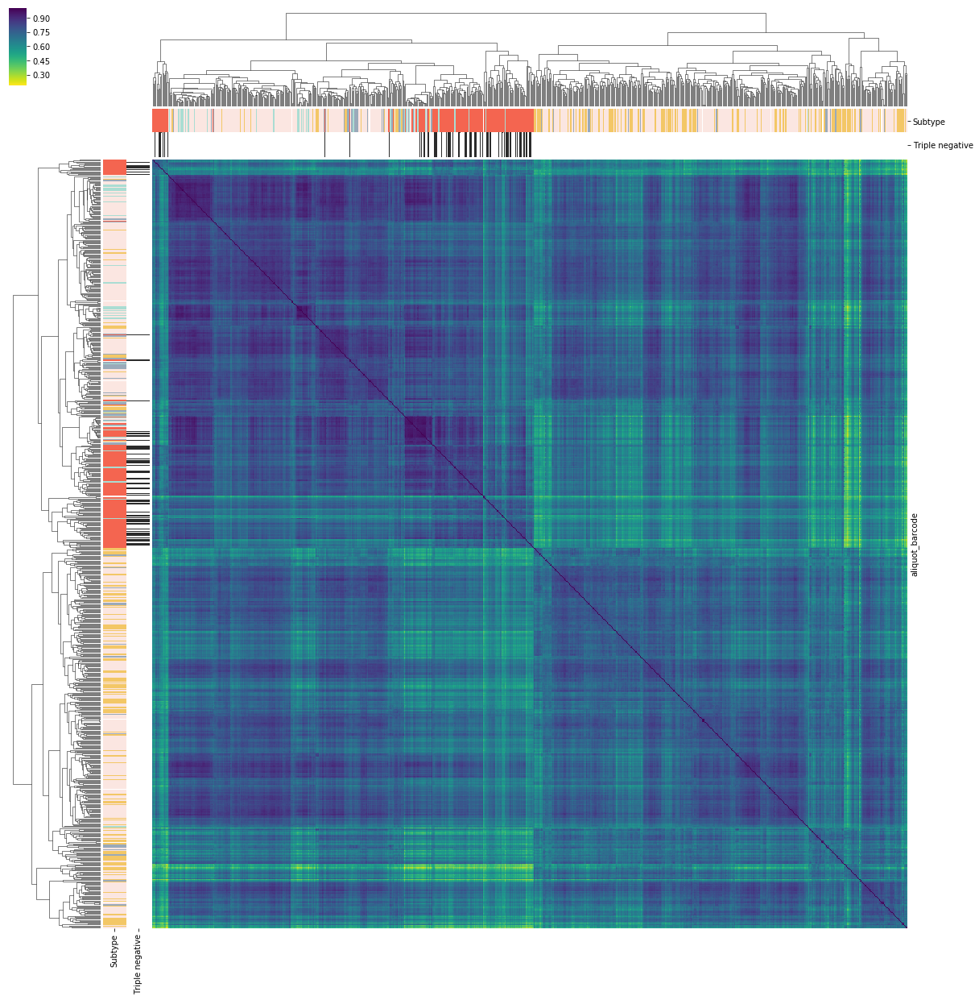

In [23]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

g3 = sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
                    row_colors=color_matrix, col_colors = color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,21), 
                    xticklabels=False, yticklabels=False)

In [24]:
g3.savefig("./plots/cluster_meth.subtype.exclNormal.corrdata.png", transparent=True, bbox_inches='tight')

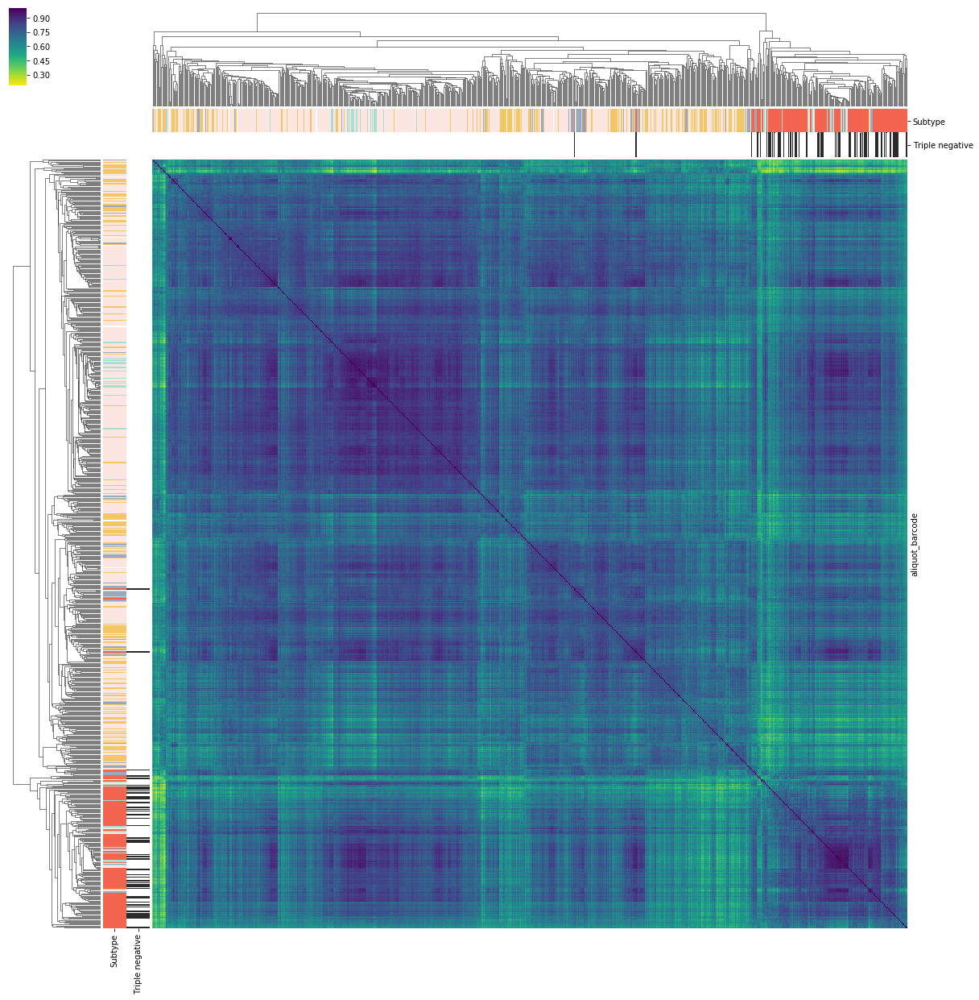

In [25]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='weighted')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

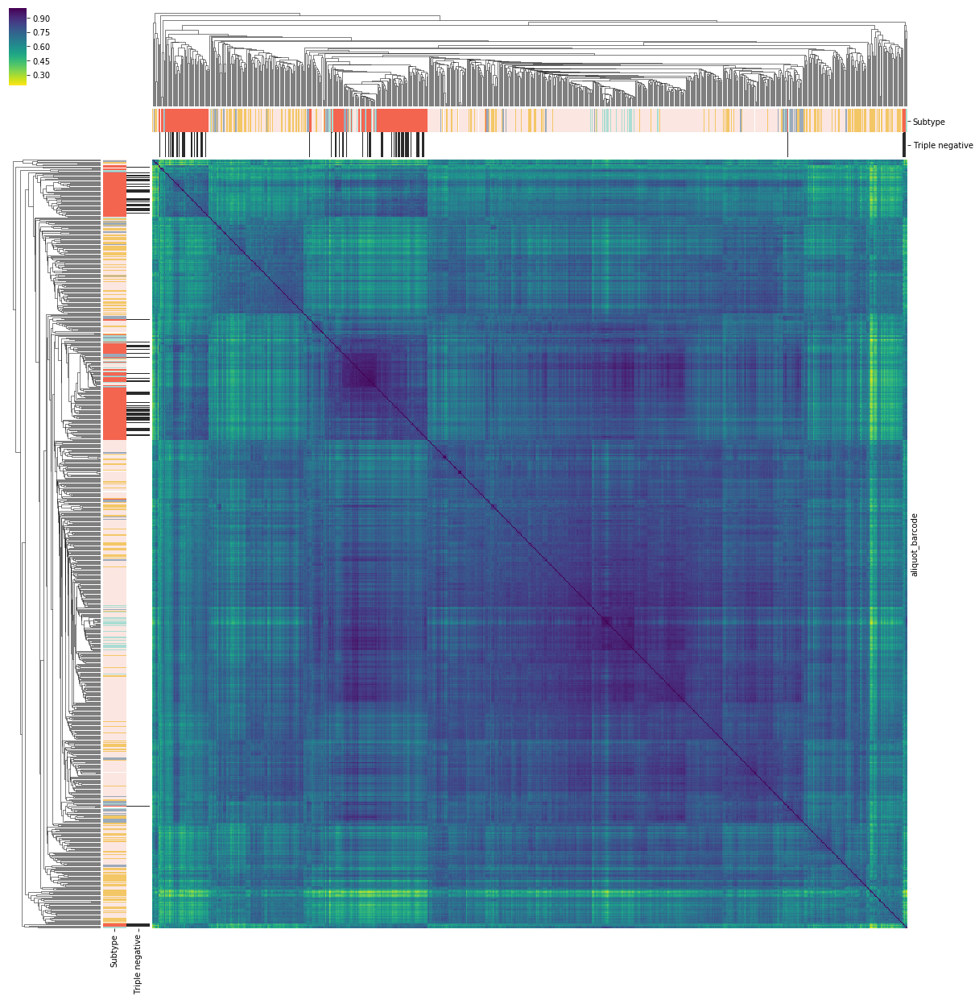

In [26]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

# Normal tissues only

In [27]:
normal_only = subtype_meth_bigtable.loc[subtype_meth_bigtable['sample_type'] == 11]
corr_normal = corr.loc[list(normal_only['aliquot_barcode'].unique()), 
                       list(normal_only['aliquot_barcode'].unique())]

print(normal_only.shape)
print(normal_only.head())

print(corr_normal.shape)

(2216781, 15)
        case_barcode    sample_barcode               aliquot_barcode  \
339226  TCGA-BH-A0DQ  TCGA-BH-A0DQ-11A  TCGA-BH-A0DQ-11A-12D-A10Q-05   
339227  TCGA-BH-A0DQ  TCGA-BH-A0DQ-11A  TCGA-BH-A0DQ-11A-12D-A10Q-05   
339228  TCGA-BH-A0DQ  TCGA-BH-A0DQ-11A  TCGA-BH-A0DQ-11A-12D-A10Q-05   
339229  TCGA-BH-A0DQ  TCGA-BH-A0DQ-11A  TCGA-BH-A0DQ-11A-12D-A10Q-05   
339230  TCGA-BH-A0DQ  TCGA-BH-A0DQ-11A  TCGA-BH-A0DQ-11A-12D-A10Q-05   

          probe_id  avg_beta_value  sample_type     sample_type_name subtype  \
339226  cg21679391            0.72           11  Solid Tissue Normal    LumA   
339227  cg01846046            0.97           11  Solid Tissue Normal    LumA   
339228  cg12967902            0.98           11  Solid Tissue Normal    LumA   
339229  cg21919790            0.99           11  Solid Tissue Normal    LumA   
339230  cg01263854            0.98           11  Solid Tissue Normal    LumA   

              ER        PR Her2_IHC Her2_ISH Her2 triple_negative subtyp

In [28]:
corr_normal.min().min()

0.7849954801855769

In [29]:
print(normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].unique())
normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].value_counts()

['LumA' 'Normal' 'Unknown']


Normal     76
Unknown    13
LumA        9
Name: subtype, dtype: int64

In [32]:
color_matrix = pd.DataFrame()
df = normal_only.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#fbe6e1", "#aaddd3", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype
aliquot_barcode,
TCGA-BH-A0DQ-11A-12D-A10Q-05,#fbe6e1
TCGA-E2-A1LS-11A-32D-A161-05,#aaddd3
TCGA-AC-A23H-11A-12D-A161-05,#aaddd3
TCGA-BH-A0BV-11A-31D-A10Q-05,#aaddd3
TCGA-AC-A2FM-11B-32D-A19Z-05,#aaddd3


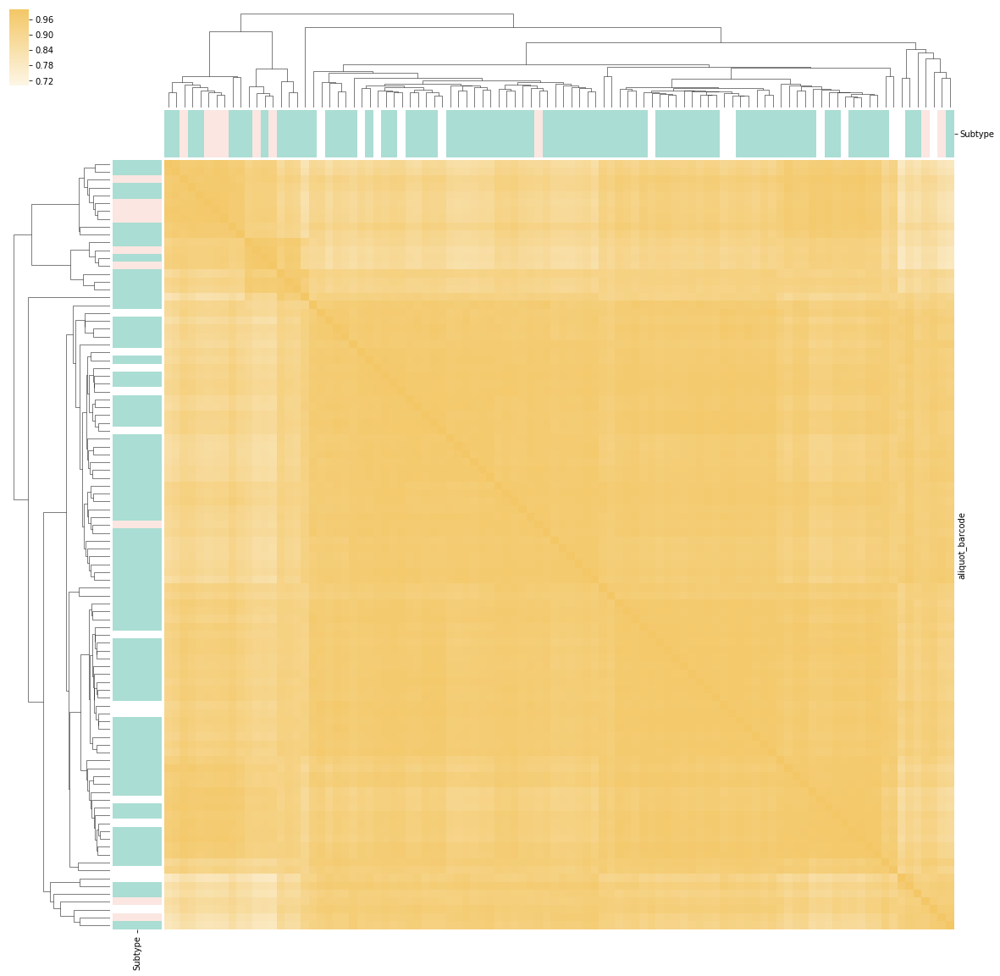

In [33]:
distance = scipy.spatial.distance.squareform(1-corr_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

sns.clustermap(data=corr_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap=sns.light_palette("#f3c766", input="hex", as_cmap=True), vmin=0.7, vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)